# Reinforcement Learning: Zero to Hero - Part 10/17

**Cells 167-167 of 291**



Starting comparison experiment...
This will train both DQN and Double DQN on CartPole-v1
Training Standard DQN on CartPole-v1
Target network updated at step 100
Target network updated at step 200
Target network updated at step 300
Target network updated at step 400
Target network updated at step 500
Target network updated at step 600
Target network updated at step 700
Episode 50/300 | Avg Reward: 15.62 | Epsilon: 0.027
Target network updated at step 800
Target network updated at step 900
Target network updated at step 1000
Target network updated at step 1100
Target network updated at step 1200
Target network updated at step 1300
Target network updated at step 1400
Target network updated at step 1500
Target network updated at step 1600
Target network updated at step 1700
Target network updated at step 1800
Target network updated at step 1900
Target network updated at step 2000
Target network updated at step 2100
Target network updated at step 2200
Target network updated at step 2300
Tar

c:\Users\ibrah\anaconda3\envs\interview_prep\Lib\site-packages\gymnasium\envs\classic_control\cartpole.py:214: UserWarning: WARN: You are calling 'step()' even though this environment has already returned terminated = True. You should always call 'reset()' once you receive 'terminated = True' -- any further steps are undefined behavior.
  logger.warn(


Episode 50/300 | Avg Reward: 1.26 | Epsilon: 1.000
Episode 100/300 | Avg Reward: 0.00 | Epsilon: 1.000
Episode 150/300 | Avg Reward: 0.00 | Epsilon: 1.000
Episode 200/300 | Avg Reward: 0.00 | Epsilon: 1.000
Episode 250/300 | Avg Reward: 0.00 | Epsilon: 1.000
Episode 300/300 | Avg Reward: 0.00 | Epsilon: 1.000

Training completed for both agents!

📊 Performance Comparison:
Standard DQN:
  Final Avg Reward (last 50): 301.76
  Best Episode: 500.00
  Avg Q-value: 113.05

Double DQN:
  Final Avg Reward (last 50): 0.00
  Best Episode: 27.00
  Avg Q-value: 0.00

⚠️ Double DQN improvement: -100.0%


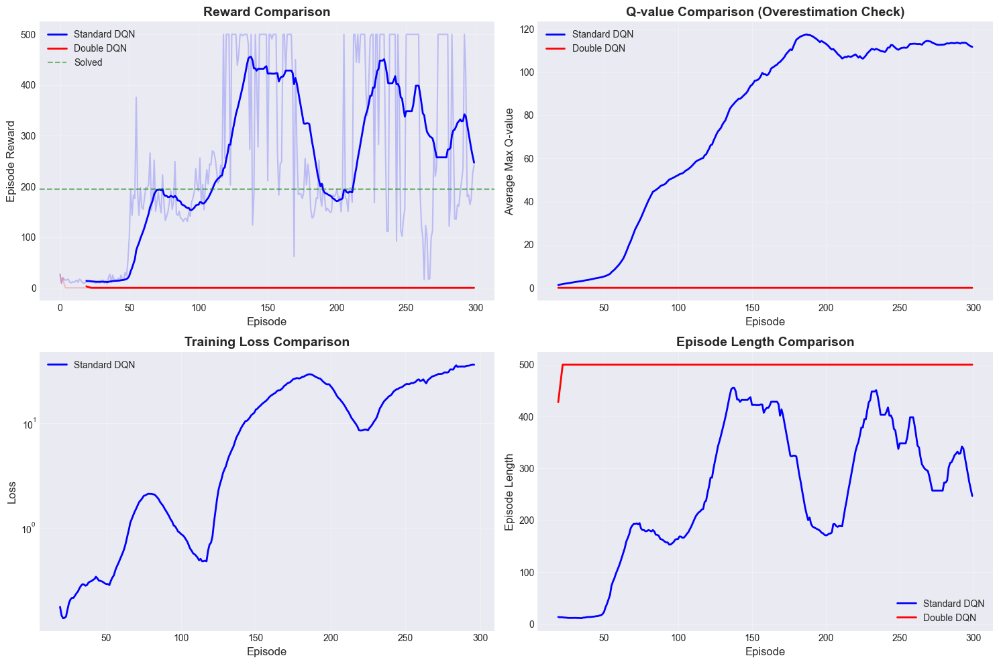


💡 Key Insights:
   - Double DQN reduces Q-value overestimation
   - Both algorithms should converge to solve CartPole-v1
   - Double DQN typically shows more stable learning
   - Check Q-value plot to see overestimation differences


In [93]:
def train_agent_comparison(agent_class, agent_name, env_name='CartPole-v1', 
                          num_episodes=300, max_steps=500, seed=42):
    """Train an agent and return metrics for comparison.
    
    Args:
        agent_class: DQNAgent or DoubleDQNAgent class
        agent_name: Name for logging
        env_name: Gym environment name
        num_episodes: Number of training episodes
        max_steps: Max steps per episode
        seed: Random seed for reproducibility
        
    Returns:
        Dictionary with training metrics
    """
    # Set seeds for reproducibility
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    
    # Create environment
    env = gym.make(env_name)
    
    # Set seed for newer Gym versions (>=0.26)
    try:
        env.reset(seed=seed)  # New API
    except TypeError:
        # Old API - try the deprecated method
        try:
            env.seed(seed)
            env.reset()
        except AttributeError:
            # If neither works, just reset without seed
            env.reset()
    
    state_dim = env.observation_space.shape[0]
    action_dim = env.action_space.n
    
    print(f"Training {agent_name} on {env_name}")
    print("=" * 60)
    
    # Create agent - pass hidden_dim as list
    agent = agent_class(
        state_dim=state_dim,
        action_dim=action_dim,
        hidden_dim=[128, 128],  # Pass as list for QNetwork
        lr=1e-3,
        gamma=0.99,
        epsilon_start=1.0,
        epsilon_end=0.01,
        epsilon_decay=0.995,
        buffer_size=10000,
        batch_size=64,
        target_update_freq=100
    )
    
    # Training metrics
    episode_rewards = []
    episode_lengths = []
    losses = []
    q_values = []  # Track Q-values to detect overestimation
    
    # Training loop
    for episode in range(num_episodes):
        state = env.reset()
        # Handle both old and new Gym API
        if isinstance(state, tuple):
            state = state[0]
            
        episode_reward = 0
        episode_loss = []
        episode_q = []
        
        for step in range(max_steps):
            # Select and perform action
            action = agent.select_action(state, training=True)
            
            # Track Q-values
            with torch.no_grad():
                state_tensor = torch.FloatTensor(state).unsqueeze(0)
                q_vals = agent.online_network(state_tensor).max().item()
                episode_q.append(q_vals)
            
            # Handle different return formats from env.step()
            step_result = env.step(action)
            
            if len(step_result) == 5:
                # New Gym API (>=0.26): returns (state, reward, terminated, truncated, info)
                next_state, reward, terminated, truncated, info = step_result
                done = terminated or truncated
            elif len(step_result) == 4:
                # Old Gym API: returns (state, reward, done, info)
                next_state, reward, done, info = step_result
            else:
                raise ValueError(f"Unexpected number of values from env.step(): {len(step_result)}")
            
            # Store transition
            agent.store_transition(state, action, reward, next_state, done)
            
            # Update agent
            try:
                loss = agent.update()
                if loss is not None:
                    episode_loss.append(loss)
            except Exception as e:
                # If update fails, print error and continue
                print(f"Warning: Update failed with error: {e}")
                continue
            
            episode_reward += reward
            state = next_state
            
            if done:
                break
        
        # Record metrics
        episode_rewards.append(episode_reward)
        episode_lengths.append(step + 1)
        if episode_loss:
            losses.append(np.mean(episode_loss))
        if episode_q:
            q_values.append(np.mean(episode_q))
        
        # Print progress
        if (episode + 1) % 50 == 0:
            avg_reward = np.mean(episode_rewards[-50:])
            print(f"Episode {episode + 1}/{num_episodes} | "
                  f"Avg Reward: {avg_reward:.2f} | "
                  f"Epsilon: {agent.epsilon:.3f}")
    
    env.close()
    
    return {
        'name': agent_name,
        'rewards': episode_rewards,
        'lengths': episode_lengths,
        'losses': losses,
        'q_values': q_values,
        'agent': agent
    }


# Train both agents with the same seed for fair comparison
print("Starting comparison experiment...")
print("This will train both DQN and Double DQN on CartPole-v1")
print("=" * 60)

# Train standard DQN
dqn_results = train_agent_comparison(
    DQNAgent, 
    "Standard DQN",
    num_episodes=300,
    seed=42
)

print("\n")

# Train Double DQN
ddqn_results = train_agent_comparison(
    DoubleDQNAgent,
    "Double DQN", 
    num_episodes=300,
    seed=42
)

print("\n" + "=" * 60)
print("Training completed for both agents!")
print("=" * 60)

# Compare final performance
print("\n📊 Performance Comparison:")
print("=" * 60)

dqn_final = np.mean(dqn_results['rewards'][-50:])
ddqn_final = np.mean(ddqn_results['rewards'][-50:])

print(f"Standard DQN:")
print(f"  Final Avg Reward (last 50): {dqn_final:.2f}")
print(f"  Best Episode: {max(dqn_results['rewards']):.2f}")
if dqn_results['q_values']:
    print(f"  Avg Q-value: {np.mean(dqn_results['q_values'][-50:]):.2f}")

print(f"\nDouble DQN:")
print(f"  Final Avg Reward (last 50): {ddqn_final:.2f}")
print(f"  Best Episode: {max(ddqn_results['rewards']):.2f}")
if ddqn_results['q_values']:
    print(f"  Avg Q-value: {np.mean(ddqn_results['q_values'][-50:]):.2f}")

if dqn_final > 0:
    improvement = ((ddqn_final - dqn_final) / dqn_final) * 100
    print(f"\n{'✅' if improvement > 0 else '⚠️'} Double DQN improvement: {improvement:+.1f}%")

# Visualize comparison
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Rewards comparison
ax1 = axes[0, 0]
window = 20
for results, color, label in [(dqn_results, 'blue', 'Standard DQN'), 
                               (ddqn_results, 'red', 'Double DQN')]:
    rewards = results['rewards']
    ax1.plot(rewards, alpha=0.2, color=color)
    if len(rewards) >= window:
        smooth = np.convolve(rewards, np.ones(window)/window, mode='valid')
        ax1.plot(range(window-1, len(rewards)), smooth, 
                linewidth=2, color=color, label=label)

ax1.axhline(y=195, color='green', linestyle='--', alpha=0.5, label='Solved')
ax1.set_xlabel('Episode', fontsize=12)
ax1.set_ylabel('Episode Reward', fontsize=12)
ax1.set_title('Reward Comparison', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Q-values comparison (overestimation detection)
ax2 = axes[0, 1]
for results, color, label in [(dqn_results, 'blue', 'Standard DQN'), 
                               (ddqn_results, 'red', 'Double DQN')]:
    q_vals = results['q_values']
    if len(q_vals) >= window:
        smooth = np.convolve(q_vals, np.ones(window)/window, mode='valid')
        ax2.plot(range(window-1, len(q_vals)), smooth, 
                linewidth=2, color=color, label=label)

ax2.set_xlabel('Episode', fontsize=12)
ax2.set_ylabel('Average Max Q-value', fontsize=12)
ax2.set_title('Q-value Comparison (Overestimation Check)', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: Loss comparison
ax3 = axes[1, 0]
for results, color, label in [(dqn_results, 'blue', 'Standard DQN'), 
                               (ddqn_results, 'red', 'Double DQN')]:
    losses = results['losses']
    if len(losses) >= window:
        smooth = np.convolve(losses, np.ones(window)/window, mode='valid')
        ax3.plot(range(window-1, len(losses)), smooth, 
                linewidth=2, color=color, label=label)

ax3.set_xlabel('Episode', fontsize=12)
ax3.set_ylabel('Loss', fontsize=12)
ax3.set_title('Training Loss Comparison', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)
ax3.set_yscale('log')

# Plot 4: Episode lengths comparison
ax4 = axes[1, 1]
for results, color, label in [(dqn_results, 'blue', 'Standard DQN'), 
                               (ddqn_results, 'red', 'Double DQN')]:
    lengths = results['lengths']
    if len(lengths) >= window:
        smooth = np.convolve(lengths, np.ones(window)/window, mode='valid')
        ax4.plot(range(window-1, len(lengths)), smooth, 
                linewidth=2, color=color, label=label)

ax4.set_xlabel('Episode', fontsize=12)
ax4.set_ylabel('Episode Length', fontsize=12)
ax4.set_title('Episode Length Comparison', fontsize=14, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n💡 Key Insights:")
print("   - Double DQN reduces Q-value overestimation")
print("   - Both algorithms should converge to solve CartPole-v1")
print("   - Double DQN typically shows more stable learning")
print("   - Check Q-value plot to see overestimation differences")
